In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from scipy import stats as stats
import math
import statsmodels.api as sm
df = pd.read_csv('DataSights_Dataset.csv')
from sklearn.model_selection import train_test_split

df.drop(['name'],axis = 1,inplace = True)
df.columns

Index(['customer_id', 'age', 'gender', 'owns_car', 'owns_house',
       'no_of_children', 'net_yearly_income', 'no_of_days_employed',
       'occupation_type', 'total_family_members', 'migrant_worker',
       'yearly_debt_payments', 'credit_limit', 'credit_limit_used(%)',
       'credit_score', 'prev_defaults', 'default_in_last_6months',
       'credit_card_default'],
      dtype='object')

In [3]:
import numpy as np
from scipy.stats import ttest_ind
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from plotly.subplots import make_subplots

In [4]:
null_counts = df.isnull().sum()
print(null_counts)

customer_id                  0
age                          0
gender                       0
owns_car                   547
owns_house                   0
no_of_children             774
net_yearly_income            0
no_of_days_employed        463
occupation_type              0
total_family_members        83
migrant_worker              87
yearly_debt_payments        95
credit_limit                 0
credit_limit_used(%)         0
credit_score                 8
prev_defaults                0
default_in_last_6months      0
credit_card_default          0
dtype: int64


In [5]:
gender_map = {'M' : 1, 'F' : 0}
owns_map = {'Y' : 1, 'N' : 0}

df['is_male'] = df['gender'].map(gender_map)
df['is_owns_house'] = df['owns_house'].map(owns_map)
df['is_owns_car'] = df['owns_car'].map(owns_map)
df['debt-to-income'] = df['yearly_debt_payments']/df['net_yearly_income']
#creating broader occupation groups

occupation_map = { "Laborers" : "Manual Labourers",
                  "Drivers" : "Manual Labourers",
                  "Cleaning staff" : "Manual Labourers",
                  "Cooking staff" : "Manual Labourers",
                  "Waiters/barmen staff" : "Manual Labourers",
                  "Low-skill Laborers" : "Manual Labourers",
                  "Accountants" : "White-Collar Staff",
                  "HR staff" : "White-Collar Staff",
                  "Secretaries" : "White-Collar Staff",
                  "Realty agents" : "White-Collar Staff",
                  "High skill tech staff" : "Technical staff",
                  "IT staff" : "Technical staff",
                  "Medicine staff" : "Technical staff",
                  "Core staff" : "Management staff",
                  "Sales staff" : "Management staff",
                  "Managers" : "Management staff",
                  "Private service staff" : "Management staff",
                  "Security staff" : "Management staff",
                  "Unknown" : "Unknown"
}

df['occupation_groups'] = df['occupation_type'].map(occupation_map)


dummies = pd.get_dummies(df['occupation_groups'], prefix='is')
df = pd.concat([df,dummies],axis = 1)


df_1 = df.drop(['customer_id','occupation_groups','occupation_type','gender','owns_house','owns_car'],axis = 1)

In [6]:
#dropping categorical variable missing values.
cat_col = ['is_owns_car','migrant_worker','is_male',
           'yearly_debt_payments','migrant_worker',
           'total_family_members','no_of_children','no_of_days_employed','total_family_members','credit_score']

for col in cat_col :
    df_1 = df_1[pd.notnull(df[col])]

df_1["is_prev_default"] = np.where(df_1['prev_defaults'] > 0 , 1, 0)
df["is_prev_default"] = np.where(df['prev_defaults'] > 0 , 1, 0)
null_counts = df_1.isnull().sum()
print(null_counts)

age                        0
no_of_children             0
net_yearly_income          0
no_of_days_employed        0
total_family_members       0
migrant_worker             0
yearly_debt_payments       0
credit_limit               0
credit_limit_used(%)       0
credit_score               0
prev_defaults              0
default_in_last_6months    0
credit_card_default        0
is_male                    0
is_owns_house              0
is_owns_car                0
debt-to-income             0
is_Management staff        0
is_Manual Labourers        0
is_Technical staff         0
is_Unknown                 0
is_White-Collar Staff      0
is_prev_default            0
dtype: int64


C:\Users\soumyadeep pal\AppData\Local\Temp\ipykernel_17012\353070335.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_1 = df_1[pd.notnull(df[col])]


In [7]:
def df_bar_graph(df,x_col,y_col):
    col_df = df.groupby(x_col)[y_col].mean().to_frame().reset_index()
    fig = px.bar(col_df,x= x_col, y = y_col,title = "<b>"+(x_col + " VS. "+ y_col)+"</b>",width = 400,height=600)
    fig.update_traces(marker_color='red')
    fig.update_layout({
    'plot_bgcolor': 'rgba(0,0,0,0)',
    'paper_bgcolor': 'rgba(0,0,0,0)'
    })
    fig.update_traces(width=0.8)
    fig.show()

def bar_proportion(df,cat1,cat2):
    df_pct = df.groupby([cat1, cat2]).size().reset_index(name='count')
    df_pct['percentage'] = df_pct.groupby(cat1)['count'].apply(lambda x: 100 * x / x.sum())
    df_pct

    fig = px.histogram(df_pct, x=cat1, y="percentage",
             color=cat2, barmode='group', 
            width = 600,height=650, title = "<b>"+(cat1 + " VS. "+ cat2)+"</b>")
    fig.update_layout({
    'plot_bgcolor': 'rgba(0,0,0,0)',
    'paper_bgcolor': 'rgba(0,0,0,0)'
    })
    fig.show()

def t_test(df,cat,num_col):
    data_cols = []
    unique_val = df[cat].unique()
    for i in unique_val:
        data_cols.append(df[df[cat] == i][num_col])
    tstat, p_value = ttest_ind(data_cols[0], data_cols[1], equal_var=False)
    print("t-statistic : ",tstat," p-value: ",p_value)
    
def ANOVA_test(df,cat_col, num_col):
    data_cols = []
    unique_val = df[cat_col].unique()
    for i in unique_val:
        data_cols.append(df[df[cat_col] == i][num_col])
    fstat, p_value = f_oneway(*data_cols)
    print("f-statistic : ",fstat," p-value: ",p_value)
    
def chi_sq_test(df,cat_col1,cat_col2):
    ct = pd.crosstab(df[cat_col1],df[cat_col2])
    obs = [ct.iloc[i] for i in range(0,2)]

    # Perform the chi-squared test of independence
    chi2, pval, dof, expected = chi2_contingency(obs)

    # Print the results
    print("Chi-squared statistic:", chi2)
    print("p-value:", pval)
    
def histogram(df,col_name,category):
    fig = px.histogram(df,col_name)
    fig.update_traces(marker_color='red')
    fig.update_layout(plot_bgcolor='white', paper_bgcolor='white',title = "<b>"+ col_name + " of "+ str(category)+"</b>")
    fig.update_layout({
    'plot_bgcolor': 'rgba(0,0,0,0)',
    'paper_bgcolor': 'rgba(0,0,0,0)'
    })
    fig.show()


In [8]:
df_bar_graph(df_1,"age","credit_card_default")
df_bar_graph(df_1,"age","debt-to-income")
df_bar_graph(df_1,"credit_card_default","age")
t_test(df_1.copy(),"credit_card_default","age")

t-statistic :  -0.39727593610553574  p-value:  0.6911843018580264


## ANALYSING GENDER DEFAULT RATE

In [9]:
df_bar_graph(df_1.copy(),"is_male","credit_card_default")
chi_sq_test(df_1.copy(),"credit_card_default","is_male")
bar_proportion(df.copy(),"occupation_groups",'is_male')
chi_sq_test(df.copy(),"occupation_groups",'is_male')
df_bar_graph(df_1.copy(),"is_male", 'debt-to-income')
t_test(df_1.copy(),"is_male", 'debt-to-income')
df_bar_graph(df_1.copy(),"is_male", 'total_family_members')
t_test(df_1.copy(),"is_male", 'total_family_members')
df_bar_graph(df_1.copy(),"is_male","prev_defaults")

Chi-squared statistic: 140.2183132877354
p-value: 2.384920627018987e-32


Chi-squared statistic: 2961.7374117038003
p-value: 0.0


t-statistic :  24.57733600546695  p-value:  3.016104449279108e-132


t-statistic :  -18.390672225456903  p-value:  4.1551818058825567e-75


In [10]:
#Cheking distribution of debt-to-income among different gender
for i in df.gender.unique():
    if(i != 'XNA'):
        histogram(df[df['gender'] == i], "debt-to-income",i)

In [11]:
gender_default = df.groupby(['gender','is_prev_default'])['credit_card_default'].sum().to_frame().reset_index()
gender_default
gender_grp_count = df.groupby('gender')['credit_card_default'].count().to_frame().reset_index()
gender_grp_count
inner_join = pd.merge(gender_default, gender_grp_count, on = 'gender',how = "inner")
inner_join
inner_join['Probability of default'] = inner_join['credit_card_default_x']/inner_join['credit_card_default_y']

fig = px.histogram(inner_join, x="gender", y="Probability of default",
              color="is_prev_default", barmode='group', 
              width = 600,height=650)
fig.update_layout({
    'plot_bgcolor': 'rgba(0,0,0,0)',
    'paper_bgcolor': 'rgba(0,0,0,0)'
})
fig.show()


## ANALYSING PROBABILITY OF DEFAULT OWING TO PREVIOUS DEFAULT

In [13]:
df_bar_graph(df_1.copy(),"is_prev_default","credit_card_default")
chi_sq_test(df_1.copy(),"is_prev_default","credit_card_default")

Chi-squared statistic: 28301.98622128276
p-value: 0.0


## ANALYZING MIGRANT WORKERS

In [14]:
#Cheking distribution of debt-to-income among different gender
for i in df.migrant_worker.unique():
        histogram(df[df['migrant_worker'] == i], "debt-to-income",i)

In [15]:
df_bar_graph(df_1.copy(),"credit_card_default","migrant_worker")
chi_sq_test(df_1.copy(),"credit_card_default","migrant_worker")
bar_proportion(df.copy(),"occupation_groups",'migrant_worker')
chi_sq_test(df.copy(),"occupation_groups","migrant_worker")
df_bar_graph(df_1.copy(),"migrant_worker", 'debt-to-income')
t_test(df_1.copy(),"migrant_worker", 'debt-to-income')
df_bar_graph(df_1.copy(),"migrant_worker", 'prev_defaults')
t_test(df_1.copy(),"migrant_worker", 'prev_defaults')

Chi-squared statistic: 52.98869220746639
p-value: 3.354741065647341e-13


Chi-squared statistic: 205.8904168900827
p-value: 1.0826839542592954e-46


t-statistic :  -3.892034327323899  p-value:  9.993842224662492e-05


t-statistic :  5.828548519153998  p-value:  5.755084877022878e-09


## ANALYZING OCCUPATION GROUPS

In [16]:
df_bar_graph(df.copy(),"occupation_groups","credit_card_default")
chi_sq_test(df.copy(),"occupation_groups","credit_card_default")
df_bar_graph(df.copy(),"occupation_groups", 'debt-to-income')
ANOVA_test(df.copy(),"occupation_groups", 'debt-to-income')
df_bar_graph(df.copy(),"occupation_groups", 'prev_defaults')
ANOVA_test(df.copy(),"occupation_groups", 'prev_defaults')

Chi-squared statistic: 72.47131380944089
p-value: 1.6947763705436325e-17


f-statistic :  nan  p-value:  nan


f-statistic :  31.869931154925705  p-value:  1.468225211510406e-26


In [17]:
occupation_group_default = df.groupby(['occupation_groups','is_prev_default'])['credit_card_default'].sum().to_frame().reset_index()
occupation_grp_count = df.groupby('occupation_groups')['credit_card_default'].count().to_frame().reset_index()

occupation_group_default['Total'] = occupation_group_default['occupation_groups'].map(dict(occupation_grp_count.values))
occupation_group_default['Probability of default'] = occupation_group_default['credit_card_default']/occupation_group_default['Total']
fig = px.histogram(occupation_group_default, x="occupation_groups", y="Probability of default",
              color="is_prev_default", barmode='group', 
             width = 600,height=400)
fig.update_layout({
    'plot_bgcolor': 'rgba(0,0,0,0)',
    'paper_bgcolor': 'rgba(0,0,0,0)'
})
fig.show()

In [53]:
df_bar_graph(df.copy(),'occupation_groups','debt-to-income')
ANOVA_test(df.copy(),'occupation_groups','net_yearly_income')
df_bar_graph(df.copy(),'occupation_groups','total_family_members')
ANOVA_test(df.copy(),'occupation_groups','total_family_members')
df_bar_graph(df.copy(),'occupation_groups','credit_limit_used(%)')

f-statistic :  6.525145852800088  p-value:  3.0297626913714448e-05


f-statistic :  nan  p-value:  nan


In [19]:
#Cheking distribution of net_yearly_income among different occupation groups
for i in df.occupation_groups.unique():
    histogram(df[df['occupation_groups'] == i], "debt-to-income",i)

AxesSubplot(0.125,0.11;0.775x0.77)


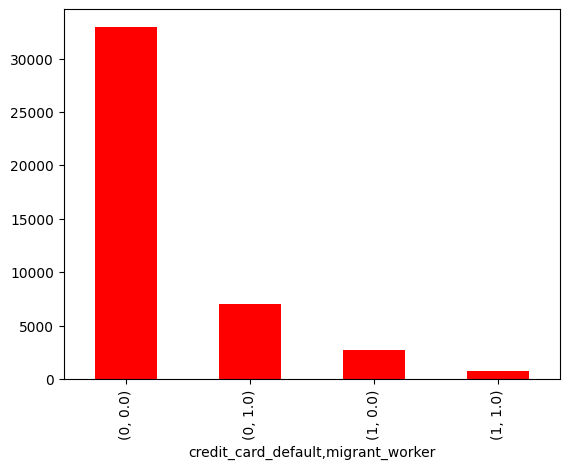

In [20]:
def plot_bar(data_imputed,column):
    print(df_1.groupby('credit_card_default')[column].value_counts().plot(kind = 'bar', color = "Red"))

plot_bar(df_1,'migrant_worker')

AxesSubplot(0.125,0.11;0.775x0.77)


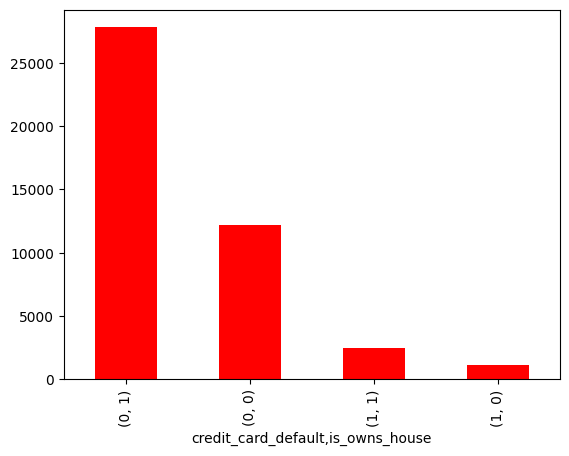

In [21]:
plot_bar(df_1,'is_owns_house')

AxesSubplot(0.125,0.11;0.775x0.77)


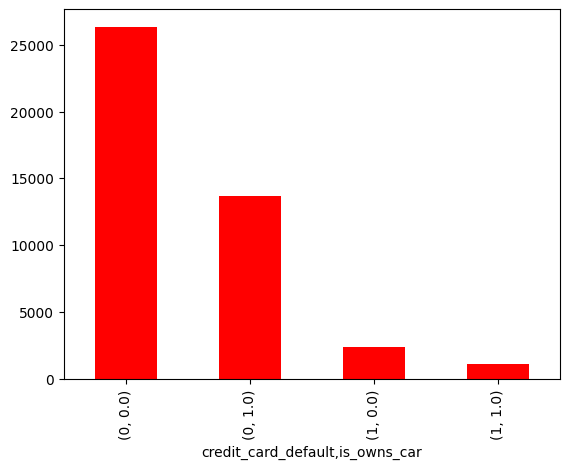

In [22]:
plot_bar(df_1,'is_owns_car')

AxesSubplot(0.125,0.11;0.775x0.77)


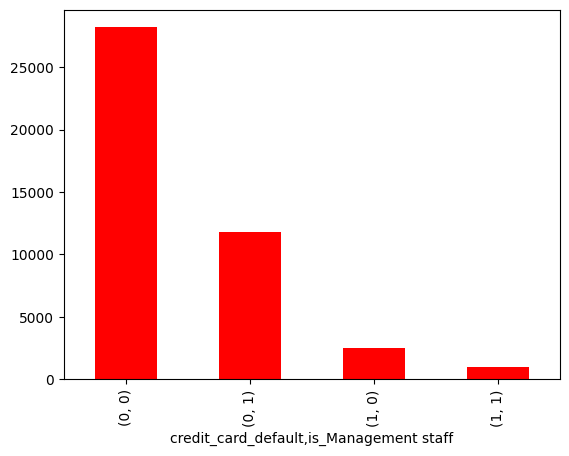

In [23]:
plot_bar(df_1,'is_Management staff')

AxesSubplot(0.125,0.11;0.775x0.77)


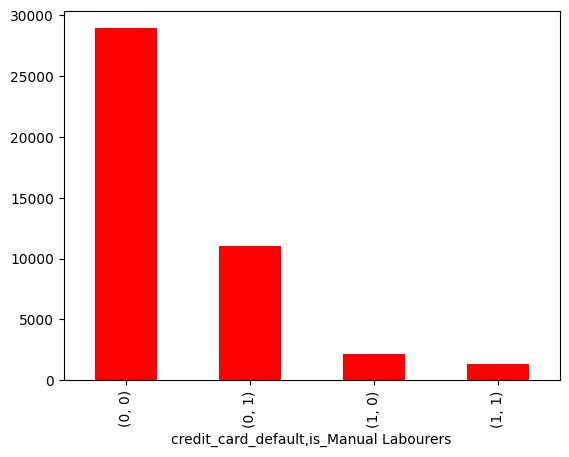

In [24]:
plot_bar(df_1,'is_Manual Labourers')

AxesSubplot(0.125,0.11;0.775x0.77)


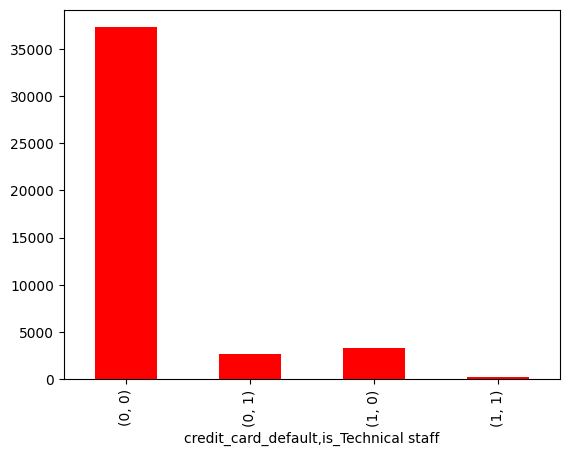

In [25]:
plot_bar(df_1,'is_Technical staff')

AxesSubplot(0.125,0.11;0.775x0.77)


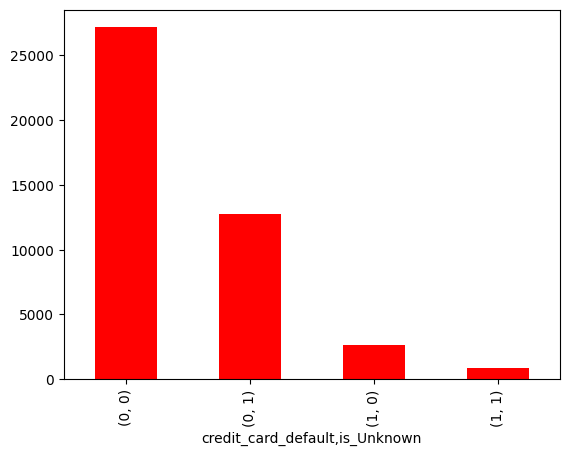

In [26]:
plot_bar(df_1,'is_Unknown')

AxesSubplot(0.125,0.11;0.775x0.77)


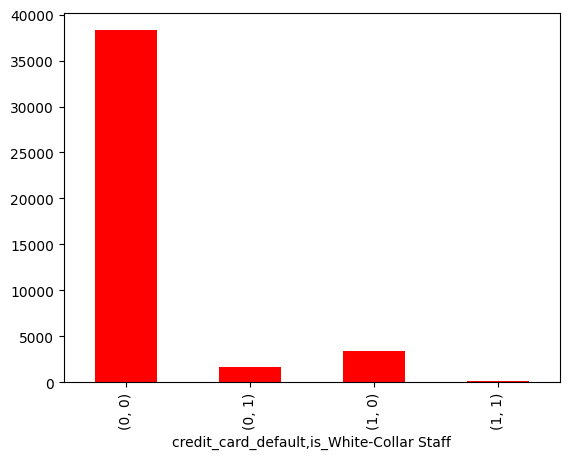

In [27]:
plot_bar(df_1,'is_White-Collar Staff')

AxesSubplot(0.125,0.11;0.775x0.77)


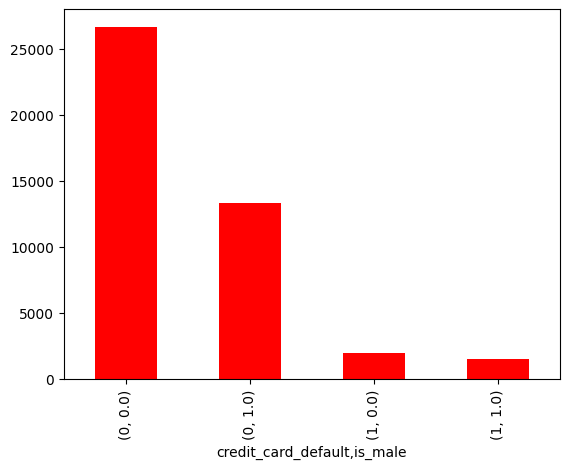

In [28]:
plot_bar(df_1,'is_male')

## MODEL BUILDING

In [29]:
X = df_1[['age', 'no_of_children', 'net_yearly_income', 'no_of_days_employed',
       'total_family_members', 'migrant_worker', 'yearly_debt_payments',
       'credit_limit', 'credit_limit_used(%)', 'credit_score', 'prev_defaults',
       'default_in_last_6months', 'is_male', "is_prev_default",
       'is_owns_house', 'is_owns_car', 'is_Management staff',
       'is_Manual Labourers', 'is_Technical staff', 'is_Unknown',
       'is_White-Collar Staff']]
Y = df_1['credit_card_default']

from imblearn.over_sampling import SMOTE
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

columns = X_train.columns
os_data_X,os_data_y=os.fit_resample(X_train, y_train)

In [30]:
lg_reg_model = sm.GLM(os_data_y, sm.add_constant(os_data_X),family=sm.families.Binomial()).fit()
lg_reg_model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: Generalized linear model
=====================================================================================
Model:                     GLM                      AIC:                 5876.5014   
Link Function:             Logit                    BIC:                 -605560.4836
Dependent Variable:        credit_card_default      Log-Likelihood:      -2916.3     
Date:                      2023-02-23 16:26         LL-Null:             -38780.     
No. Observations:          55948                    Deviance:            5832.5      
Df Model:                  21                       Pearson chi2:        7.20e+03    
Df Residuals:              55926                    Scale:               1.0000      
Method:                    IRLS                                                      
-------------------------------------------------------------------------------------
                         Coef.     Std.Err.     z     P>|z|     [0.025       0.975]  
-------------------------------------------------------------------------------------
const                    70.7409  27283.5533   0.0026 0.9979  -53404.0410  53545.5228
age                       0.0023      0.0037   0.6250 0.5320      -0.0050      0.0097
no_of_children            0.1319      0.1029   1.2816 0.2000      -0.0698      0.3337
net_yearly_income        -0.0000      0.0000  -3.1492 0.0016      -0.0000     -0.0000
no_of_days_employed       0.0000      0.0000   9.0847 0.0000       0.0000      0.0000
total_family_members     -0.0915      0.0825  -1.1094 0.2673      -0.2533      0.0702
migrant_worker            0.2369      0.0952   2.4875 0.0129       0.0502      0.4235
yearly_debt_payments      0.0000      0.0000   2.9936 0.0028       0.0000      0.0000
credit_limit              0.0000      0.0000   3.3722 0.0007       0.0000      0.0000
credit_limit_used(%)      0.0914      0.0026  35.1805 0.0000       0.0863      0.0965
credit_score             -0.0722      0.0017 -42.8701 0.0000      -0.0756     -0.0689
prev_defaults            22.7716 102870.7409   0.0002 0.9998 -201600.1757 201645.7188
default_in_last_6months  21.6723  25734.6715   0.0008 0.9993  -50417.3571  50460.7016
is_male                   0.5216      0.0821   6.3550 0.0000       0.3607      0.6825
is_prev_default          -0.4541 105864.2043  -0.0000 1.0000 -207490.4816 207489.5735
is_owns_house            -0.9147      0.0697 -13.1183 0.0000      -1.0514     -0.7781
is_owns_car              -0.1333      0.0839  -1.5887 0.1121      -0.2978      0.0312
is_Management staff     -29.4136  27283.5533  -0.0011 0.9991  -53504.1955  53445.3682
is_Manual Labourers     -29.0994  27283.5533  -0.0011 0.9991  -53503.8813  53445.6825
is_Technical staff      -30.9236  27283.5533  -0.0011 0.9991  -53505.7054  53443.8583
is_Unknown              -30.3106  27283.5533  -0.0011 0.9991  -53505.0925  53444.4712
is_White-Collar Staff   -30.9353  27283.5533  -0.0011 0.9991  -53505.7172  53443.8466
=====================================================================================

"""

In [31]:
#Removing insignificant variables
X = df_1[[ 'net_yearly_income', 'no_of_days_employed',
       'migrant_worker', 'yearly_debt_payments',
       'credit_limit', 'credit_limit_used(%)', 'credit_score', 
       'is_male','is_owns_house']]
Y = df_1['credit_card_default']


os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

columns = X_train.columns
os_data_X,os_data_y=os.fit_resample(X_train, y_train)

In [32]:
lg_reg_model = sm.GLM(os_data_y, sm.add_constant(os_data_X),family=sm.families.Binomial()).fit()
lg_reg_model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Results: Generalized linear model
=====================================================================
Model:               GLM                 AIC:            8403.4987   
Link Function:       Logit               BIC:            -603140.6724
Dependent Variable:  credit_card_default Log-Likelihood: -4191.7     
Date:                2023-02-23 16:26    LL-Null:        -38780.     
No. Observations:    55948               Deviance:       8383.5      
Df Model:            9                   Pearson chi2:   1.26e+04    
Df Residuals:        55938               Scale:          1.0000      
Method:              IRLS                                            
---------------------------------------------------------------------
                      Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------
const                47.8056   0.9169  52.1381 0.0000 46.0085 49.6027
net_yearly_income    -0.0000   0.0000  -3.4072 0.0007 -0.0000 -0.0000
no_of_days_employed  -0.0000   0.0000  -5.0965 0.0000 -0.0000 -0.0000
migrant_worker        0.1204   0.0801   1.5030 0.1328 -0.0366  0.2774
yearly_debt_payments  0.0000   0.0000   2.8233 0.0048  0.0000  0.0000
credit_limit          0.0000   0.0000   2.1540 0.0312  0.0000  0.0000
credit_limit_used(%)  0.1033   0.0023  44.8368 0.0000  0.0988  0.1079
credit_score         -0.0819   0.0014 -58.4658 0.0000 -0.0846 -0.0791
is_male               0.5841   0.0643   9.0781 0.0000  0.4580  0.7102
is_owns_house        -0.9819   0.0591 -16.6214 0.0000 -1.0977 -0.8661
=====================================================================

"""

In [33]:
#Removing insignificant variables
X = df_1[[ 'net_yearly_income', 'no_of_days_employed',
        'yearly_debt_payments',
       'credit_limit', 'credit_limit_used(%)', 'credit_score', 
       'is_male','is_owns_house']]
Y = df_1['credit_card_default']


os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

columns = X_train.columns
os_data_X,os_data_y=os.fit_resample(X_train, y_train)

In [34]:
lg_reg_model = sm.GLM(os_data_y, sm.add_constant(os_data_X),family=sm.families.Binomial()).fit()
lg_reg_model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Results: Generalized linear model
=====================================================================
Model:               GLM                 AIC:            8403.7621   
Link Function:       Logit               BIC:            -603149.3412
Dependent Variable:  credit_card_default Log-Likelihood: -4192.9     
Date:                2023-02-23 16:26    LL-Null:        -38780.     
No. Observations:    55948               Deviance:       8385.8      
Df Model:            8                   Pearson chi2:   1.26e+04    
Df Residuals:        55939               Scale:          1.0000      
Method:              IRLS                                            
---------------------------------------------------------------------
                      Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------
const                47.8990   0.9158  52.3004 0.0000 46.1040 49.6941
net_yearly_income    -0.0000   0.0000  -3.4056 0.0007 -0.0000 -0.0000
no_of_days_employed  -0.0000   0.0000  -5.5628 0.0000 -0.0000 -0.0000
yearly_debt_payments  0.0000   0.0000   2.7848 0.0054  0.0000  0.0000
credit_limit          0.0000   0.0000   2.1332 0.0329  0.0000  0.0000
credit_limit_used(%)  0.1033   0.0023  44.8675 0.0000  0.0987  0.1078
credit_score         -0.0820   0.0014 -58.5094 0.0000 -0.0847 -0.0792
is_male               0.5941   0.0640   9.2850 0.0000  0.4687  0.7195
is_owns_house        -0.9856   0.0590 -16.6995 0.0000 -1.1013 -0.8700
=====================================================================

"""

In [35]:
def get_predictions ( test_class, model, test_data ):
    y_pred_df = pd.DataFrame( { 'actual': test_class,
                               'predicted_prob': model.get_prediction(sm.add_constant(test_data)).predicted_mean})
    return y_pred_df

In [36]:
X_test = X_test[[ 'net_yearly_income', 'no_of_days_employed',
        'yearly_debt_payments',
       'credit_limit', 'credit_limit_used(%)', 'credit_score', 
       'is_male','is_owns_house']]

predict_test_df = pd.DataFrame(get_predictions(y_test, lg_reg_model, X_test))
predict_test_df.head()

,actual,predicted_prob
32408,0,0.187852
29726,0,0.052643
30333,0,0.000502
37345,0,0.000018
5239,0,0.025745


In [37]:
predict_test_df['Converted'] = predict_test_df.predicted_prob.map(lambda x: 1 if x > 0.5 else 0)
predict_test_df[0:10]

,actual,predicted_prob,Converted
32408,0,1.878520e-01,0
29726,0,5.264279e-02,0
30333,0,5.017611e-04,0
37345,0,1.789958e-05,0
5239,0,2.574543e-02,0
4279,0,3.248554e-07,0
22085,0,1.235086e-05,0
4887,0,2.010711e-03,0
12822,0,7.198205e-13,0
4305,0,1.124754e-10,0


In [38]:
from sklearn import metrics
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [39]:
print(confusion_matrix(y_test, predict_test_df.Converted))
lg_reg_report = (classification_report(y_test, predict_test_df.Converted))
print(lg_reg_report)

[[11555   448]
 [   83   967]]
              precision    recall  f1-score   support

           0       0.99      0.96      0.98     12003
           1       0.68      0.92      0.78      1050

    accuracy                           0.96     13053
   macro avg       0.84      0.94      0.88     13053
weighted avg       0.97      0.96      0.96     13053



In [40]:
predict_test_df['predicted_code'] = predict_test_df.Converted
predict_test_df['actual_code'] = predict_test_df.actual

In [41]:
def draw_cm( actual, predicted ):
    plt.figure(figsize=(9,9))
    cm = metrics.confusion_matrix( actual, predicted )
    custom_palette = sns.color_palette("Reds", n_colors=100)
    sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels = ["Defaulter", "Not Defaulter"] , 
               yticklabels = ["Defaulter", "Not Defaulter"], cmap = custom_palette,vmin = 80, vmax = 11560)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Classification Matrix Plot', size = 15);
    plt.show()

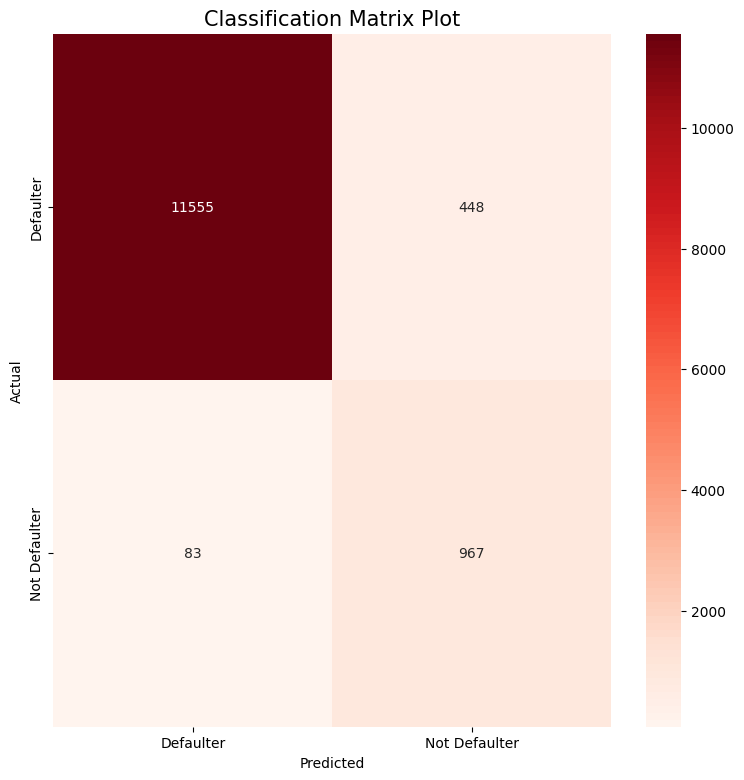

In [42]:
draw_cm( predict_test_df.actual_code, predict_test_df.predicted_code )

In [43]:
def measure_performance (clasf_matrix):
    measure = pd.DataFrame({
                        'sensitivity': [round(clasf_matrix[0,0]/(clasf_matrix[0,0]+clasf_matrix[0,1]),2)], 
                        'specificity': [round(clasf_matrix[1,1]/(clasf_matrix[1,0]+clasf_matrix[1,1]),2)],
                        'recall': [round(clasf_matrix[0,0]/(clasf_matrix[0,0]+clasf_matrix[0,1]),2)],
                        'precision': [round(clasf_matrix[0,0]/(clasf_matrix[0,0]+clasf_matrix[1,0]),2)],
                        'overall_acc': [round((clasf_matrix[0,0]+clasf_matrix[1,1])/
                                              (clasf_matrix[0,0]+clasf_matrix[0,1]+clasf_matrix[1,0]+clasf_matrix[1,1]),2)]
                       })
    return measure

In [44]:
cm = metrics.confusion_matrix(predict_test_df.actual_code, predict_test_df.predicted_code)

lg_reg_metrics_df = pd.DataFrame(measure_performance(cm))
print(lg_reg_metrics_df)

print( 'Total Accuracy sklearn: ',np.round( metrics.accuracy_score( predict_test_df.actual_code, predict_test_df.predicted_code ), 2 ))

   sensitivity  specificity  recall  precision  overall_acc
0         0.96         0.92    0.96       0.99         0.96
Total Accuracy sklearn:  0.96


In [45]:
lg_pred_prob_df = lg_reg_model.predict(sm.add_constant(X_train))
n = len(X_train)

#Pass the correct code in dictionary below.

d = {"Defaulted":(0,1), "Not defaulted": (2,0)}
    
costs = pd.DataFrame(d, index = ('Defaulter', 'Non-Defaulter'))

print(costs)

costs.iloc[0][1] #to refer to specific value at a given position

               Defaulted  Not defaulted
Defaulter              0              2
Non-Defaulter          1              0


2

In [46]:
predict_test_df.shape

(13053, 5)

In [47]:
def frange(start, stop, step):
    s = start
    while s < stop:
        yield s
        s += step

In [48]:
#creating empty vectors to store the results.
cutoff = []
P11 = [] #correct classification of positive as positive
P00 = [] #correct classification of negative as negative
P10 = [] #misclassification of positive class to negative class
P01 = [] #misclassification of negative class to positive class

for i in frange(0.00, 1, 0.05):
    predicted_y = predict_test_df.predicted_prob.map(lambda x: 1 if x > i else 0)
    tbl = metrics.confusion_matrix(predict_test_df.actual_code, predicted_y)
    if ( i <= 1):
        j = int(20*i)
        P01.append(tbl[1,0]/(tbl[1,0] + tbl[1,1]))
        P00.append(tbl[1,1]/(tbl[1,0] + tbl[1,1]))#specifity
        P10.append(tbl[0,1]/(tbl[0,0] + tbl[0,1]))
        P11.append(tbl[0,0]/(tbl[0,0] + tbl[0,1]))#sensitivity
        cutoff.append(i)

d = {'cutoff':cutoff,'P10':P10,'P01': P01,'P00': P00,'P11':P11}
df_cost_table = pd.DataFrame(d, columns=['cutoff','P00','P01','P10','P11'])

In [49]:
df_cost_table

,cutoff,P00,P01,P10,P11
0,0.00,1.000000,0.000000,1.000000,0.000000
1,0.05,0.999048,0.000952,0.101475,0.898525
2,0.10,0.995238,0.004762,0.082979,0.917021
3,0.15,0.990476,0.009524,0.072399,0.927601
4,0.20,0.980952,0.019048,0.064317,0.935683
5,0.25,0.972381,0.027619,0.058319,0.941681
6,0.30,0.964762,0.035238,0.052987,0.947013
7,0.35,0.954286,0.045714,0.047571,0.952429
8,0.40,0.940952,0.059048,0.044156,0.955844
9,0.45,0.932381,0.067619,0.039740,0.960260


In [50]:
df_cost_table['youden_index'] = df_cost_table['P00']+df_cost_table['P11'] -1
df_cost_table

,cutoff,P00,P01,P10,P11,youden_index
0,0.00,1.000000,0.000000,1.000000,0.000000,0.000000
1,0.05,0.999048,0.000952,0.101475,0.898525,0.897573
2,0.10,0.995238,0.004762,0.082979,0.917021,0.912259
3,0.15,0.990476,0.009524,0.072399,0.927601,0.918078
4,0.20,0.980952,0.019048,0.064317,0.935683,0.916635
5,0.25,0.972381,0.027619,0.058319,0.941681,0.914062
6,0.30,0.964762,0.035238,0.052987,0.947013,0.911775
7,0.35,0.954286,0.045714,0.047571,0.952429,0.906714
8,0.40,0.940952,0.059048,0.044156,0.955844,0.896797
9,0.45,0.932381,0.067619,0.039740,0.960260,0.892641


In [51]:
predict_test_df['predicted_youdens'] = predict_test_df.predicted_prob.map(lambda x: 1 if x > 0.15 else 0) 
predict_test_df[0:10]

,actual,predicted_prob,Converted,predicted_code,actual_code,predicted_youdens
32408,0,1.878520e-01,0,0,0,1
29726,0,5.264279e-02,0,0,0,0
30333,0,5.017611e-04,0,0,0,0
37345,0,1.789958e-05,0,0,0,0
5239,0,2.574543e-02,0,0,0,0
4279,0,3.248554e-07,0,0,0,0
22085,0,1.235086e-05,0,0,0,0
4887,0,2.010711e-03,0,0,0,0
12822,0,7.198205e-13,0,0,0,0
4305,0,1.124754e-10,0,0,0,0


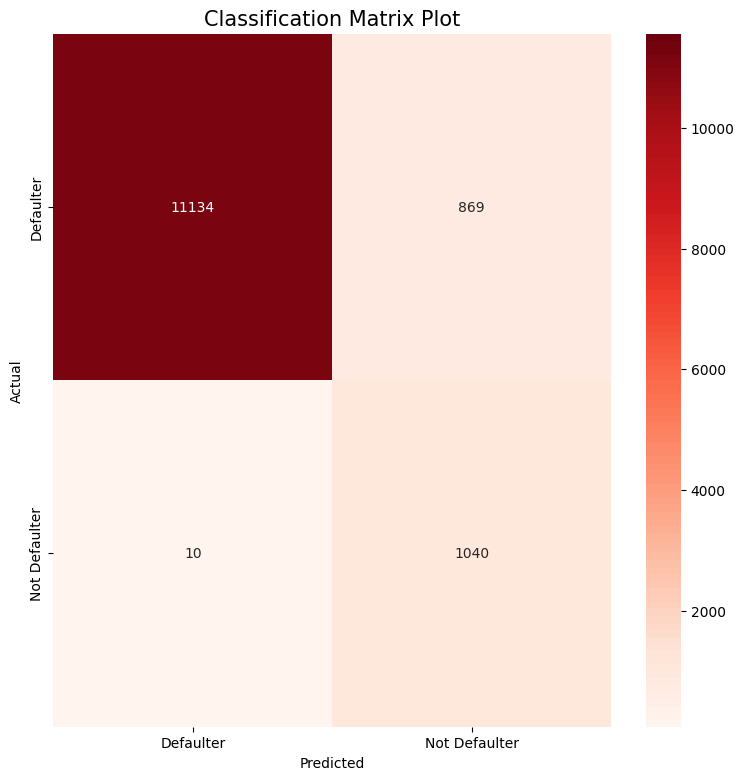

In [52]:
draw_cm( predict_test_df.actual, predict_test_df.predicted_youdens)